In [1]:
import scarches
from scarches.models.scpoli import scPoli
import torch
import gc
import anndata
import pandas as pd
import numpy as np
import scanpy as sc
import scipy
import seaborn as sns

import hnoca.map as mapping

import matplotlib.pyplot as plt

/home/ubuntu/.pyenv/versions/3.9.19/envs/cuml_pytorch-3.9/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).


In [2]:
sc.set_figure_params(dpi_save=300, dpi=150)
sc.settings.figdir = "/storage/data/2404_revision/hnoca_ce_figures/"

# Loading query data

In [3]:
adata_ref_hvg = anndata.read_h5ad("/storage/data/final_adata_object_export/hnoca_full_cleanedmeta_hvg.h5ad")

In [4]:
basepath = "/storage/data/2404_revision/ce_data"

adata_query = anndata.concat({
    "ce_wang2024":anndata.read_h5ad(f"{basepath}/gage_data/gage.h5ad"),
    "ce_bertucci2023": anndata.read_h5ad(f"{basepath}/bowles_data/bowles.h5ad"),
    "ce_caporale2023": anndata.read_h5ad(f"{basepath}/testa_data/testa_mosaic.h5ad"),
    "ce_lopeztobon2023": anndata.read_h5ad(f"{basepath}/testa_data/testa_ndd.h5ad"),
    "ce_dony2024": anndata.read_h5ad(f"{basepath}/binder_data/binder.h5ad"),
}, join="outer", index_unique="_")

adata_query.write("/storage/data/2404_revision/ce_output/hnoca_ce_query_allgenes.h5ad", compression="gzip")

In [5]:
adata_ref_hvg.obs["snapseed_pca_rss_level_1"] = "unknown"
adata_ref_hvg.obs["snapseed_pca_rss_level_12"] = "unknown"
adata_ref_hvg.obs["snapseed_pca_rss_level_123"] = "unknown"

adata_query.obs["snapseed_pca_rss_level_1"] = "unknown"
adata_query.obs["snapseed_pca_rss_level_12"] = "unknown"
adata_query.obs["snapseed_pca_rss_level_123"] = "unknown"

adata_query = adata_query[:, adata_ref_hvg.var_names].copy()

# Mapping to HNOCA

In [16]:
reference_model = scPoli.load("/storage/data/organoid_atlas_adatas/230510_data/scpoli_hierarchical123/", adata_ref_hvg, map_location=torch.device("cuda"))
mapper = mapping.AtlasMapper(reference_model)

AnnData object with n_obs × n_vars = 1770578 × 3000
    obs: 'assay_differentiation', 'assay_sc', 'assay_sc_original', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_line_original', 'cell_type', 'cell_type_original', 'development_stage', 'development_stage_original', 'disease', 'disease_original', 'ethnicity', 'ethnicity_original', 'gm', 'id', 'individual', 'organ', 'organ_original', 'organism', 'organism_original', 'sample_source', 'sex', 'sex_original', 'source_doi', 'state_exact', 'suspension_type', 'suspension_type_original', 'tech_sample', 'treatment', 'organoid_age_days', 'publication', 'doi', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'annot_level_1', 'annot_level_2', 'annot_level_3_rev2', 'annot_level_4_rev2', 'annot_region_rev2', 'annot_ntt_rev2', 'Hallmark_Glycolysis', 'snapseed_pca_rss_level_1', 'snapseed_pca_rss_level_12', 'snapseed_pca_rss_level_

In [17]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 10,
    "reduce_lr": True,
    "lr_patience": 5,
    "lr_factor": 0.1,
}

mapper.map_query(
    adata_query,
    retrain="partial",
    max_epochs=20,
    batch_size=256,
    unlabeled_prototype_training=False,
    n_epochs=10,
    pretraining_epochs=9,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=10,
    alpha_epoch_anneal=10,
)

mapper.query_model.save("/storage/data/2404_revision/ce_output/240619_scpoli_ce")

INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


Embedding dictionary:
 	Num conditions: [460]
 	Embedding dim: [5]
Encoder Architecture:
	Input Layer in, out and cond: 3000 1024 5
	Mean/Var Layer in/out: 1024 10
Decoder Architecture:
	First Layer in, out and cond:  10 1024 5
	Output Layer in/out:  1024 3000 

The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {'unknown'}
Therefore integer value of those labels is set to -1
The missing labels are: {

In [18]:
mapper.compute_wknn(k=100)

Info: GPU detected and cuml installed. Use cuML for neighborhood estimation.
Info: GPU detected and cuml installed. Use cuML for neighborhood estimation.


In [19]:
labels = mapper.transfer_labels("annot_level_2")
mapper.query_adata.obs["annot_level_2_pred"] = labels["best_label"]
mapper.query_adata.obs["annot_level_2_score"] = labels["best_score"]
mapper.query_adata.obs["annot_level_2_logscore"] = np.log1p(mapper.query_adata.obs["annot_level_2_score"])

# Plotting

In [20]:
sc.pp.neighbors(mapper.query_adata, use_rep = "X_latent", key_added="knn_hnocatools", transformer="rapids")
sc.tl.umap(mapper.query_adata, neighbors_key="knn_hnocatools")

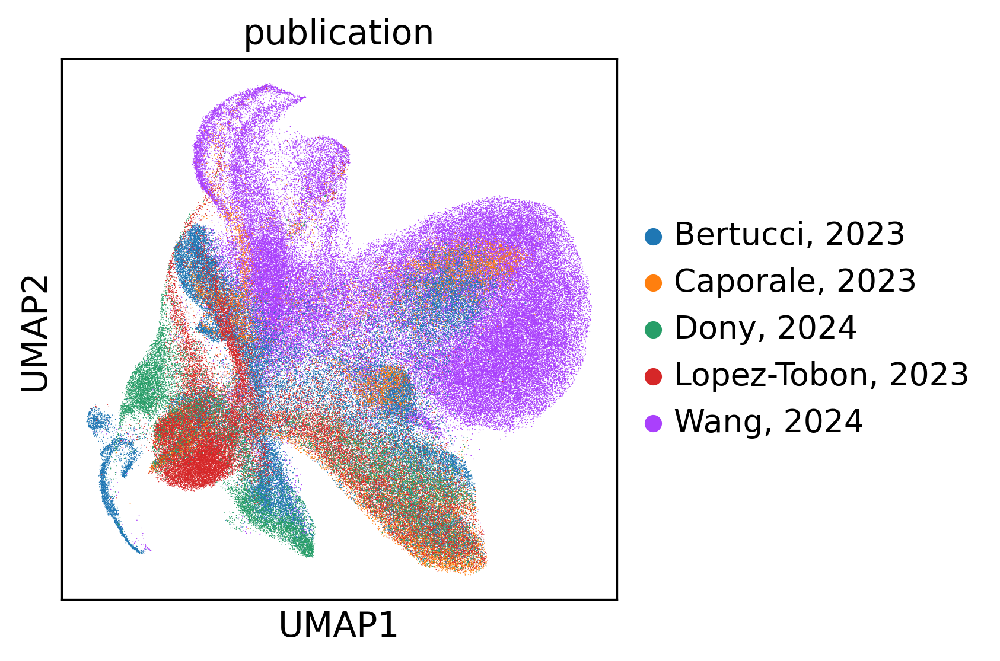

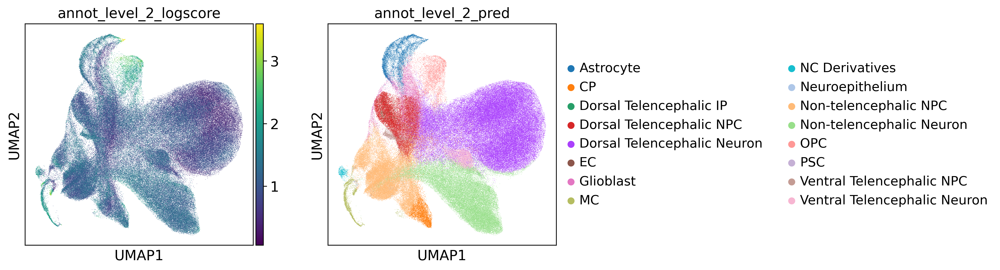

In [21]:
sc.pl.umap(mapper.query_adata, color="publication")
sc.pl.umap(mapper.query_adata, color=["annot_level_2_logscore", "annot_level_2_pred"])

# Project full atlas

In [53]:
adata_joint = anndata.read_h5ad("/storage/data/final_adata_object_export/hnoca_full_ce_hvg.h5ad")
adata_joint.X = adata_joint.layers["counts_lengthnorm"].copy()

In [24]:
adata_joint.obsm["X_scpoli"] = mapper.query_model.get_latent(
    adata_joint,
    mean=True
)
sc.pp.neighbors(adata_joint, use_rep = "X_scpoli", key_added="knn_scpoli", transformer='rapids')
adata_joint.obsm["X_umap_scpoli"] = sc.tl.umap(adata_joint, neighbors_key="knn_scpoli", copy=True).obsm["X_umap"]

In [77]:
colormap_l2 = {
    'PSC': '#fee8c8',
    'Neuroepithelium': '#fee0d2',
    'Dorsal Telencephalic NPC': '#9ecae1',
    'Ventral Telencephalic NPC': '#bcbddc',
    'Non-telencephalic NPC': '#fcbba1',
    'Dorsal Telencephalic IP': '#6baed6',
    'Dorsal Telencephalic Neuron': '#4292c6',
    'Ventral Telencephalic Neuron': '#9e9ac8',
    'Non-telencephalic Neuron': '#fb6a4a',
    'Glioblast': '#addd8e',
    'Astrocyte': '#31a354',
    'OPC': '#005a32',
    'CP': '#fdbb84',
    'Microglia': '#303030',
    'NC Derivatives': '#bdbdbd',
    'EC': '#696969',
    'MC': '#909090',
}

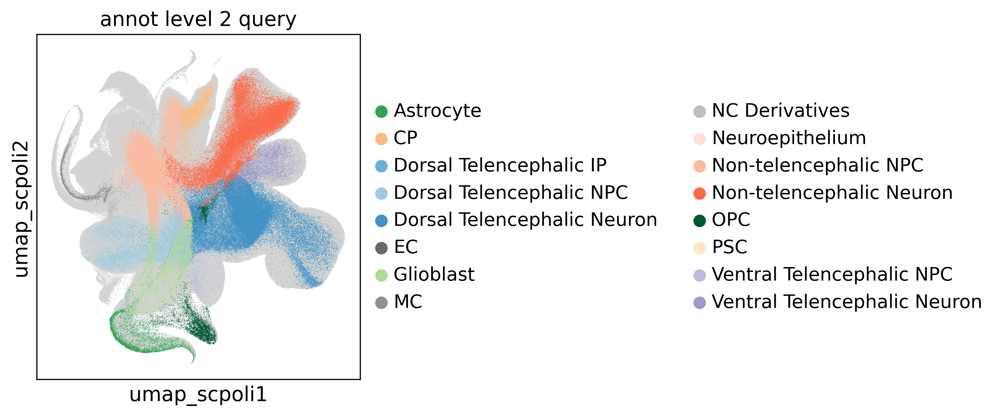

In [106]:
adata_joint.obs["annot_level_2_query"] = mapper.query_adata.obs["annot_level_2_pred"]
l2pal = [colormap_l2[i] for i in adata_joint.obs["annot_level_2_query"].cat.categories]
sc.pl.scatter(adata_joint, basis="umap_scpoli", color="annot_level_2_query", size=0.7, palette=l2pal, save="_joint_query_level2.pdf")

In [22]:
newpubs = ["Wang, 2024", "Bertucci, 2023", "Caporale, 2023", "Lopez-Tobon, 2023", "Dony, 2024"]

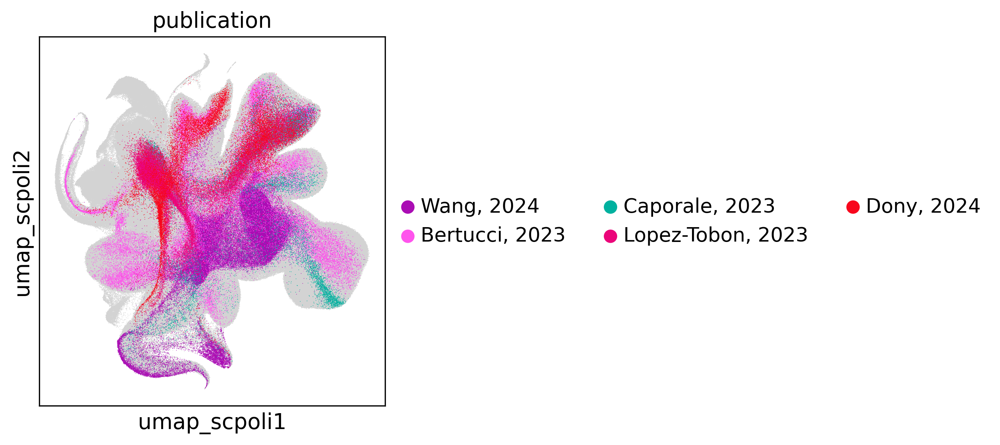

In [108]:
adata_joint.obs["publication"] = adata_joint.obs["publication"].cat.reorder_categories(newpubs + [i for i in adata_joint.obs["publication"].cat.categories if i not in newpubs])
sc.pl.scatter(adata_joint, basis="umap_scpoli", color="publication", size=0.7, groups=newpubs, palette=["#AA0DB4", "#FF54ED", "#00B19F", "#EB057A", "#F8071D", "#FF8D1A", "#9EFF37"], save="_joint_query_pub.pdf")

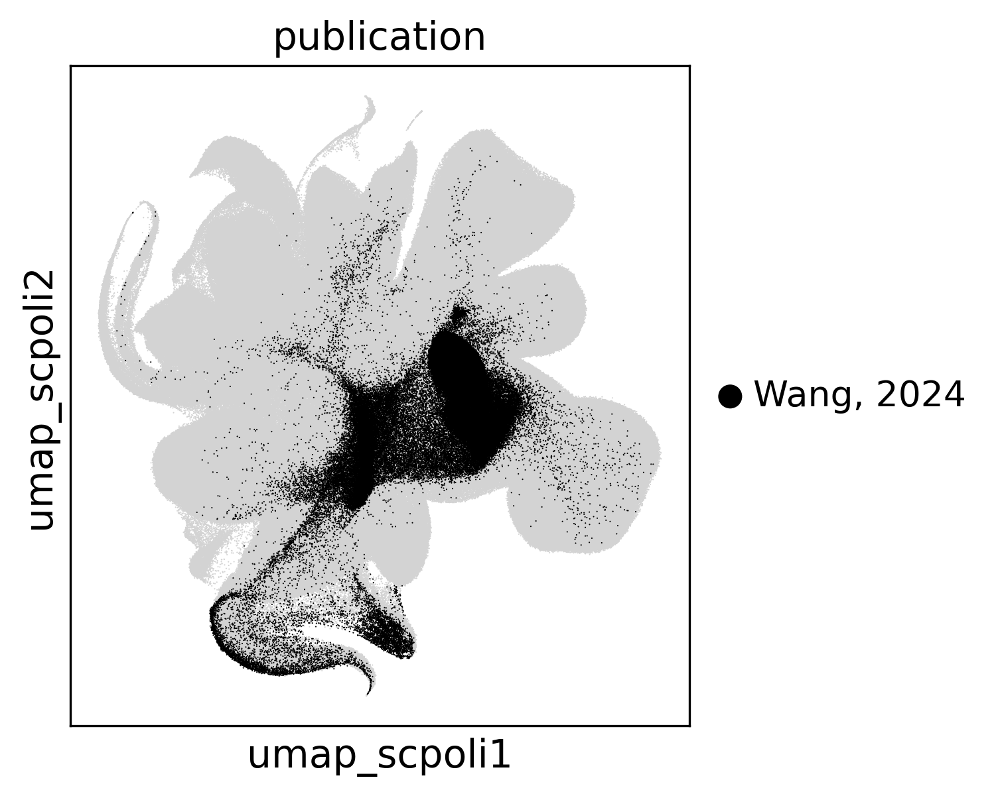

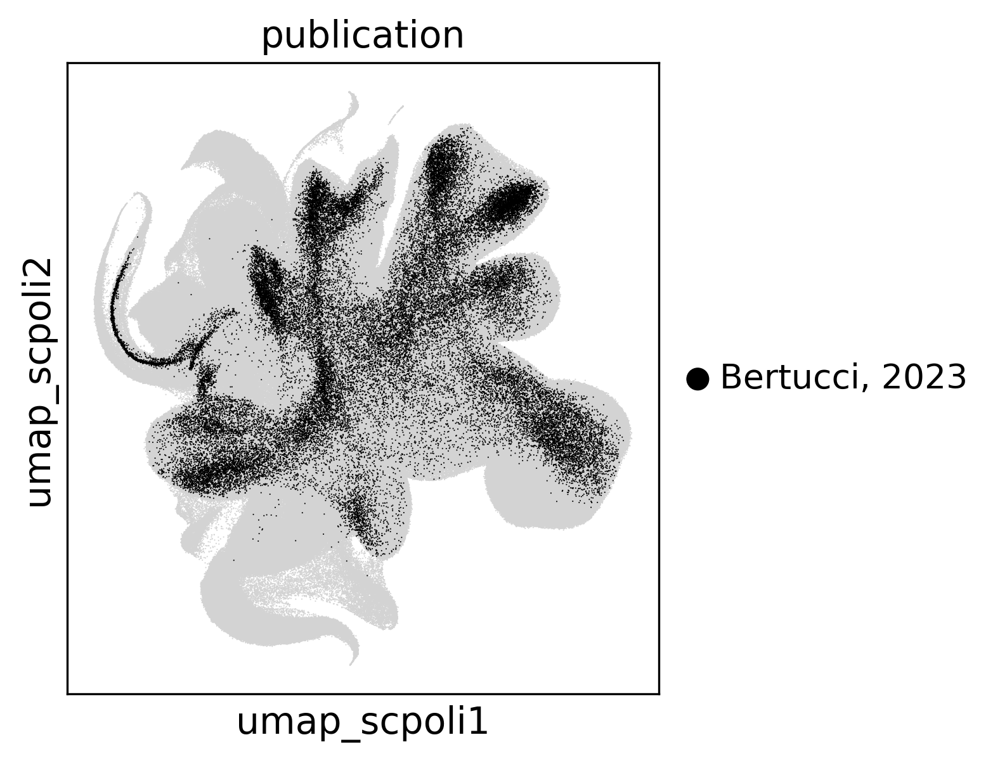

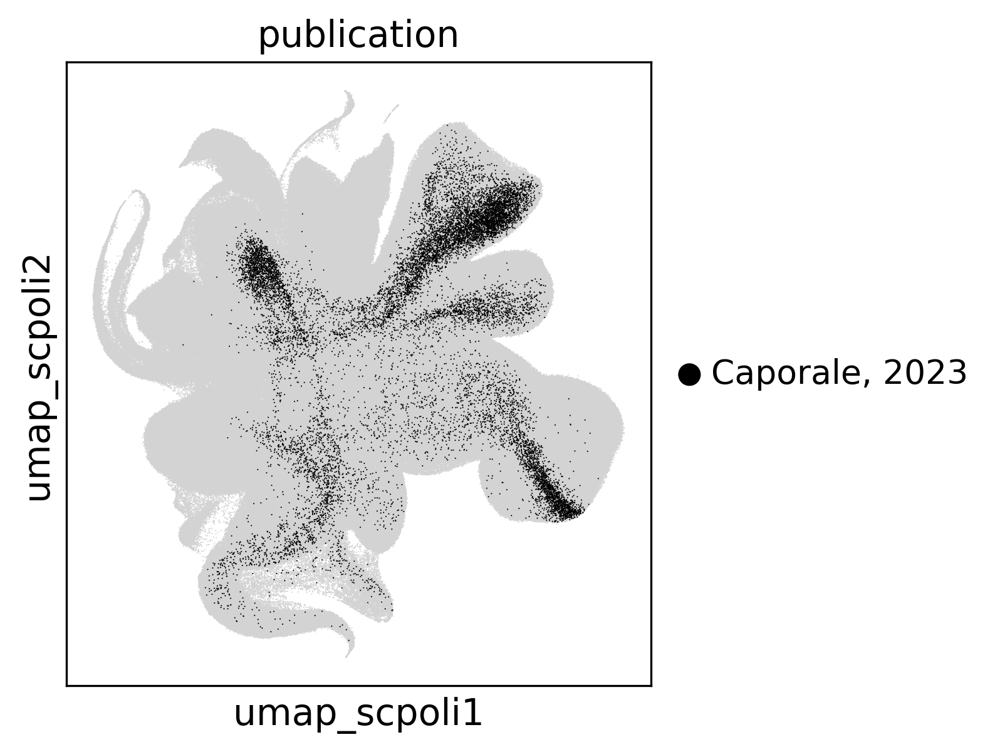

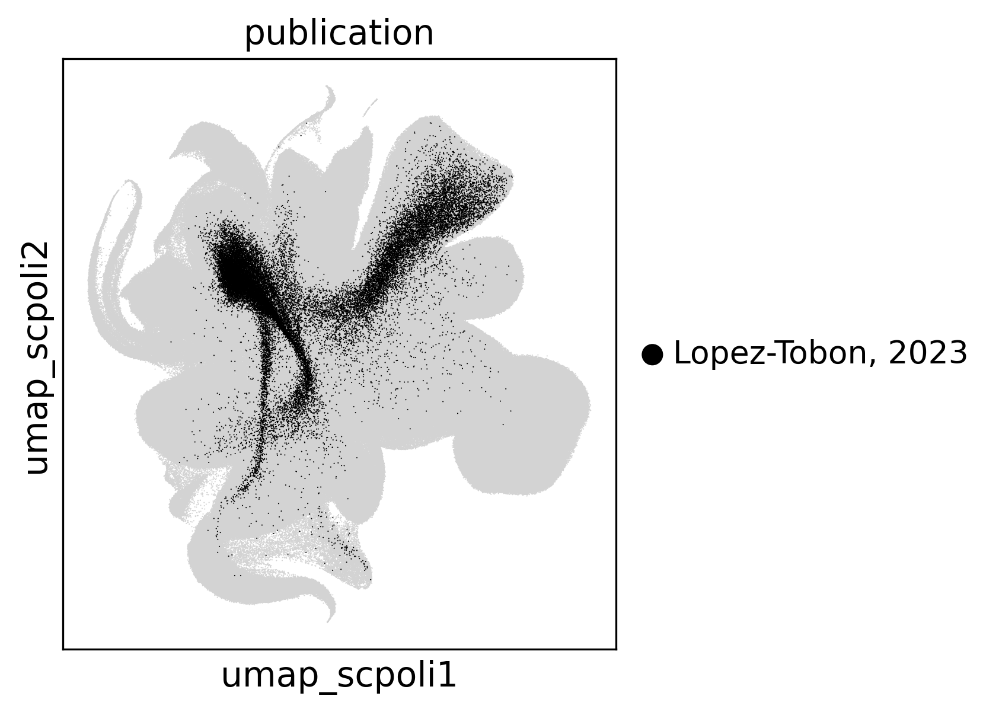

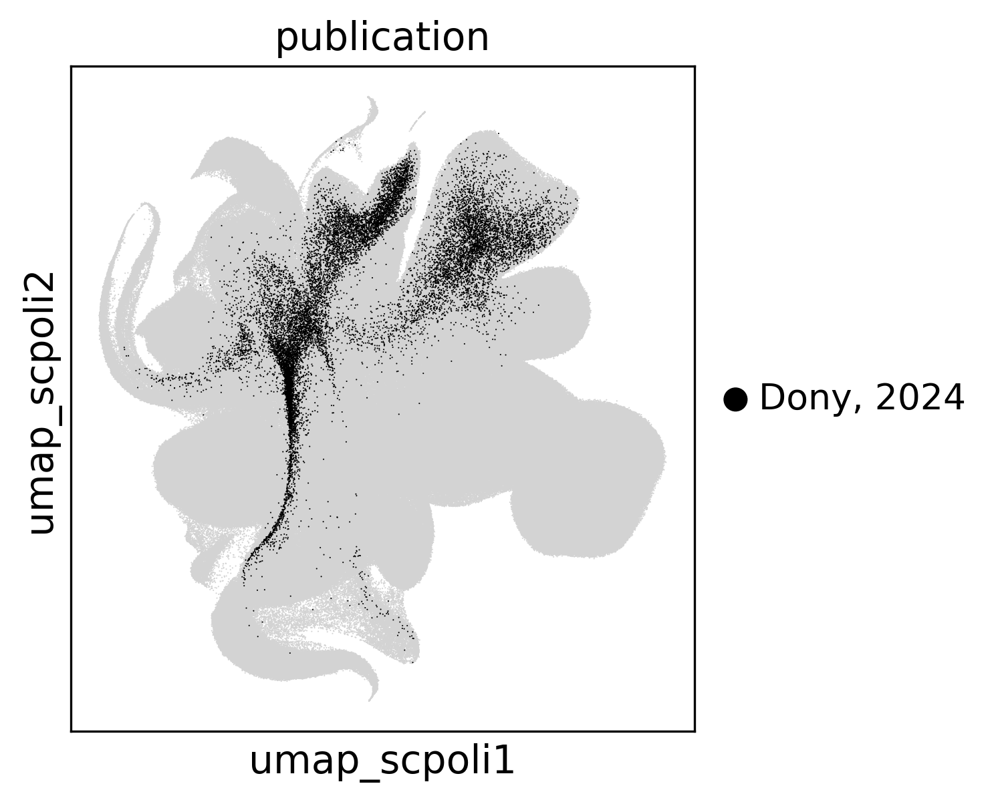

In [109]:
for p in newpubs:
    sc.pl.scatter(adata_joint, basis="umap_scpoli", color="publication", groups=[p], size=1.0, palette=["#000000"], save=f"_joint_query_pub_{p}.pdf")

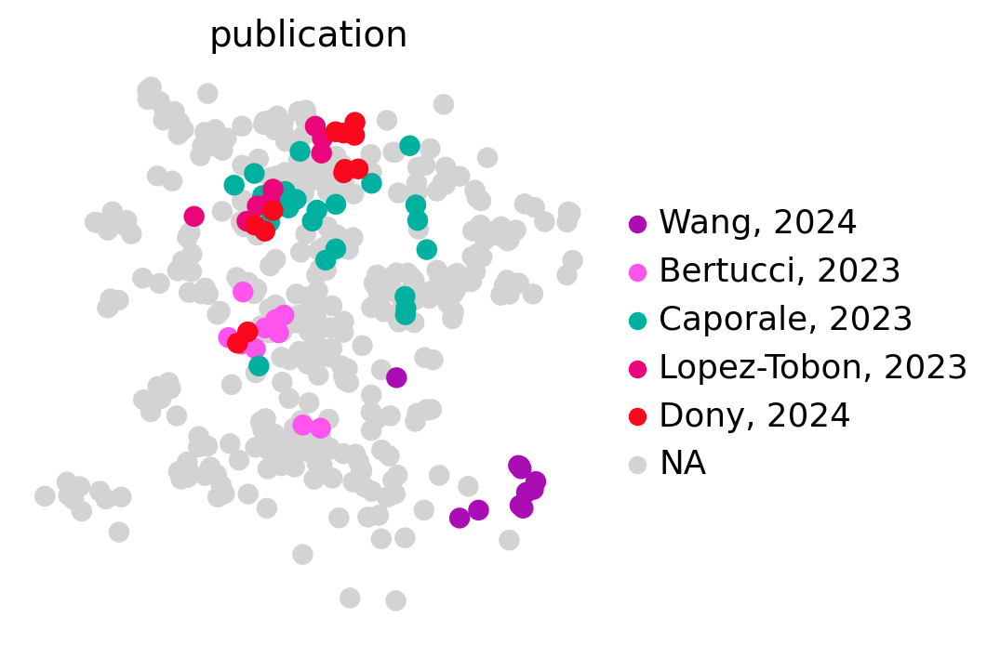

In [24]:
se = mapper.query_model.get_conditional_embeddings()
sc.pp.pca(se)
se.obs = adata_joint.obs.groupby("batch").first().loc[se.obs.index.tolist()]
se.write("/storage/data/2404_revision/ce_output/240619_scpoli_ce_sample_embeddings.h5ad")

sc.set_figure_params(dpi_save=300, dpi=100, format="pdf", frameon=False)
sc.settings.figdir = "/storage/data/2404_revision/ce_output/sample_embeddings"
sc.pl.pca(se, color="publication", groups=newpubs, palette=["#AA0DB4", "#FF54ED", "#00B19F", "#EB057A", "#F8071D", "#FF8D1A", "#9EFF37"], save=f"_publication_new.pdf")

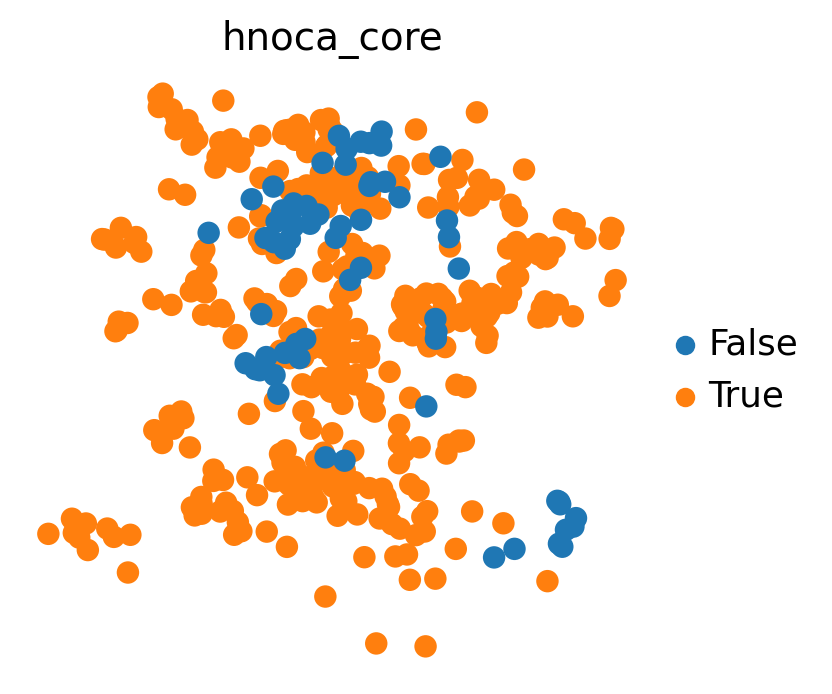

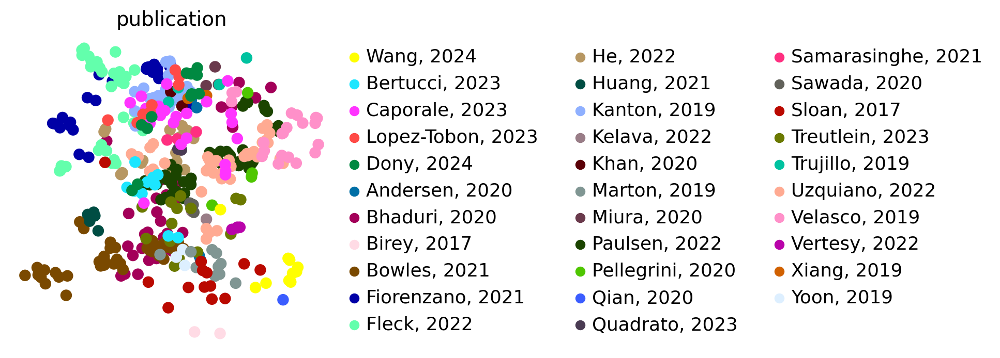

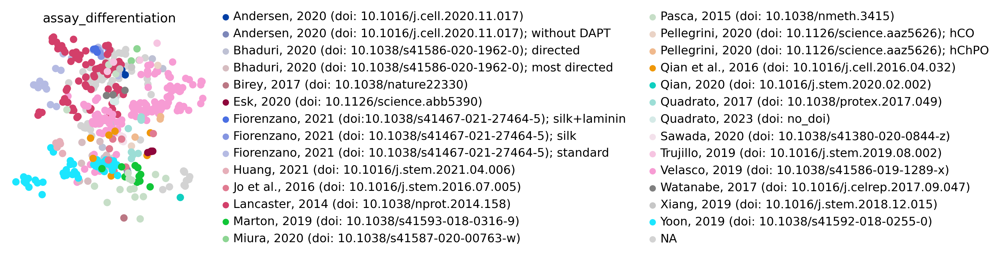

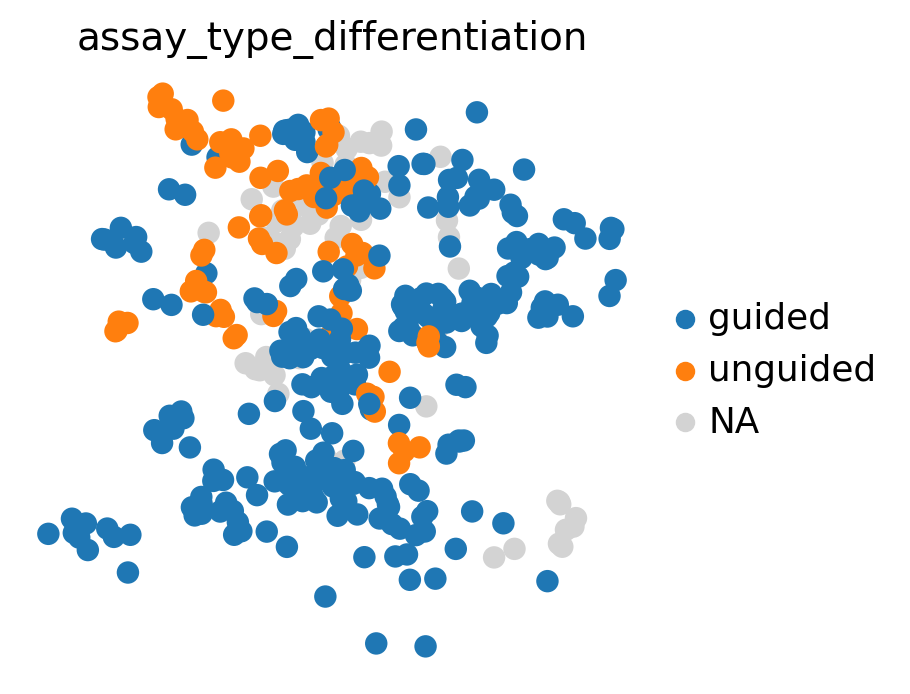

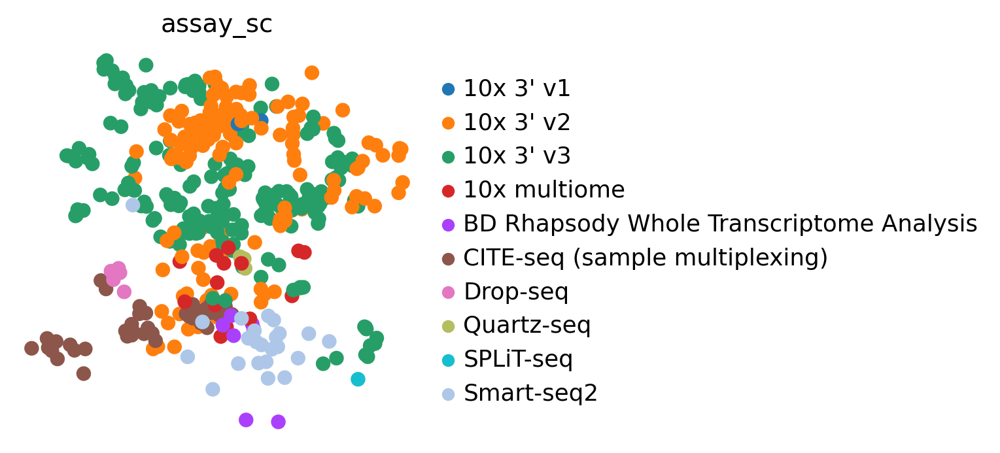

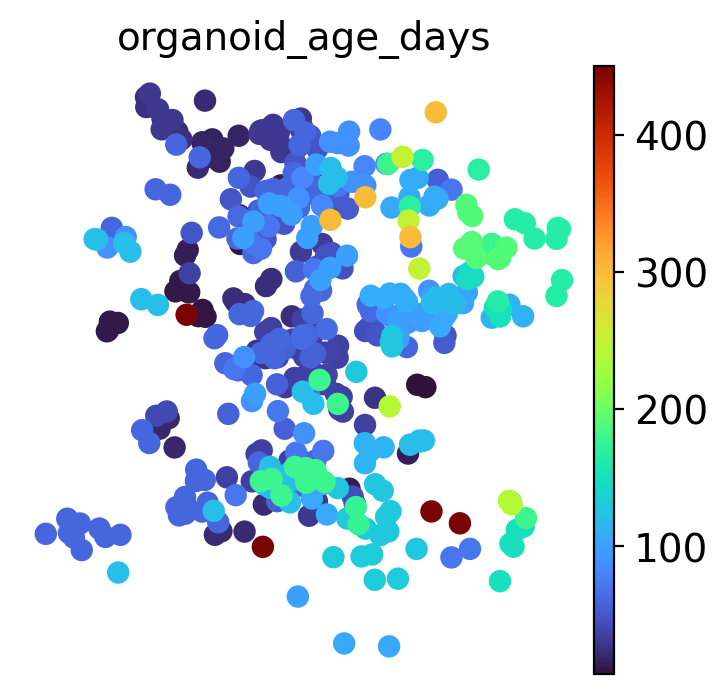

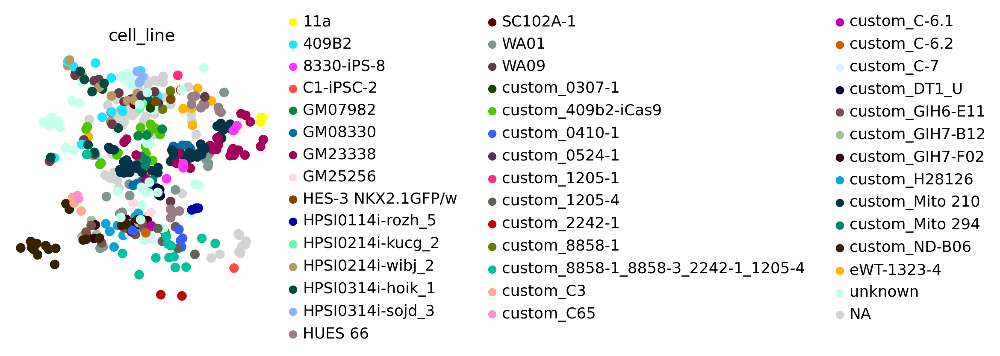

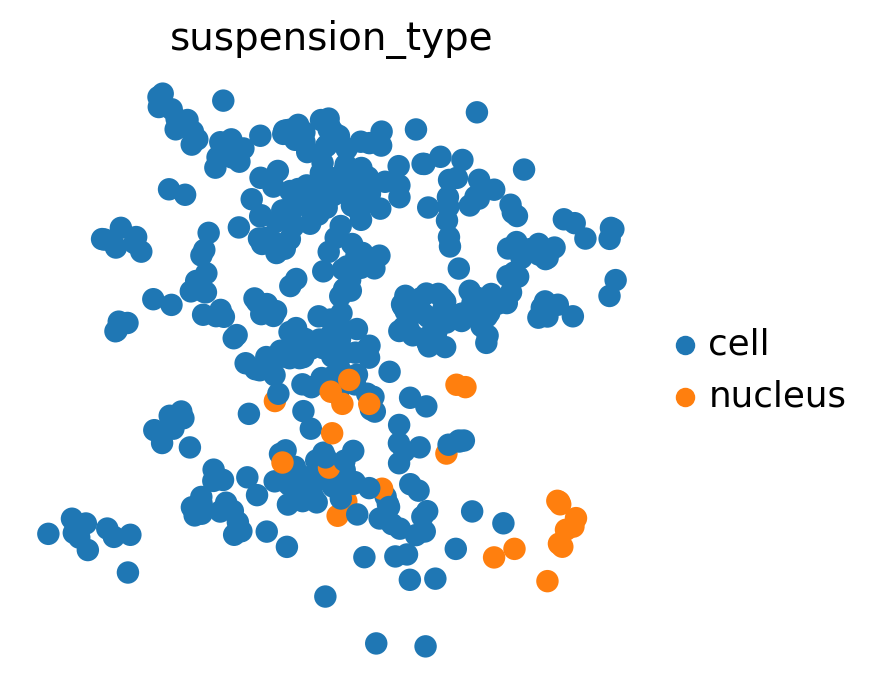

In [21]:
for k in [
    "hnoca_core",
    "publication",
    "assay_differentiation",
    "assay_type_differentiation",
    "assay_sc",
    "organoid_age_days",
    "cell_line",
    "suspension_type",
]:
    sc.pl.pca(se, color=k, cmap="turbo", save=f"_{k}.pdf")

# Saving objects

In [162]:
mapper.save("/storage/data/2404_revision/ce_output/mapper_community")
mapper.query_adata.write("/storage/data/2404_revision/ce_output/hnoca_community_query.h5ad", compression="gzip")

In [89]:
adata_joint.write("/storage/data/2404_revision/ce_output/hnoca_community_joint.h5ad", compression="gzip")